In [2]:
%pip install gymnasium pygame ale-py "autorom[accept-rom-license]" stable-baselines3 matplotlib
# Install necessary libraries within the notebook (if not already installed)
%pip install Box2D gymnasium[box2d] pygame ale-py "autorom[accept-rom-license]" stable-baselines3 matplotlib moviepy opencv-python


Note: you may need to restart the kernel to use updated packages.
zsh:1: no matches found: gymnasium[box2d]
Note: you may need to restart the kernel to use updated packages.


In [4]:
%pip install box2d-py


Note: you may need to restart the kernel to use updated packages.


In [5]:
#atari
%pip install "autorom[accept-rom-license]"



Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install ale-py AutoROM
#run "python -m autorom --accept-license"


Note: you may need to restart the kernel to use updated packages.


In [4]:
"""
Begin iteration 1
this iteration doesn't focus much on training, just making sure i am using the 
environment correctly.
"""

"\nBegin iteration 1\nthis iteration doesn't focus much on training, just making sure i am using the \nenvironment correctly.\n"

In [9]:
#setup
import os
os.environ["IMAGEIO_FFMPEG_EXE"] = "/opt/homebrew/bin/ffmpeg"  # Adjust the path if necessary

import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import PPO
import pygame
#from moviepy.editor import ImageSequenceClip

# Initialize Pygame
pygame.init()

# Create the environment without specifying render_mode
env = gym.make('LunarLander-v2')
#env = gym.make('LunarLander-v2', render_mode='human')


In [10]:
# Initialize the PPO agent
model = PPO('MlpPolicy', env, verbose=1)


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [11]:
# Train the agent
model.learn(total_timesteps=100)
model.save("ppo_lunarlander")



---------------------------------
| rollout/           |          |
|    ep_len_mean     | 85.8     |
|    ep_rew_mean     | -211     |
| time/              |          |
|    fps             | 4916     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------


In [12]:
#evaluate model

# Create a new environment with rendering enabled
env = gym.make('LunarLander-v2', render_mode='human')

# Evaluate the trained agent with rendering
obs, info = env.reset()
done, truncated = False, False

while not done and not truncated:
    action, _states = model.predict(obs)
    obs, reward, done, truncated, info = env.step(action)
    env.render()

    # Handle Pygame events to close the window
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            done = True
            truncated = True
            break

env.close()

# Quit Pygame
pygame.quit()


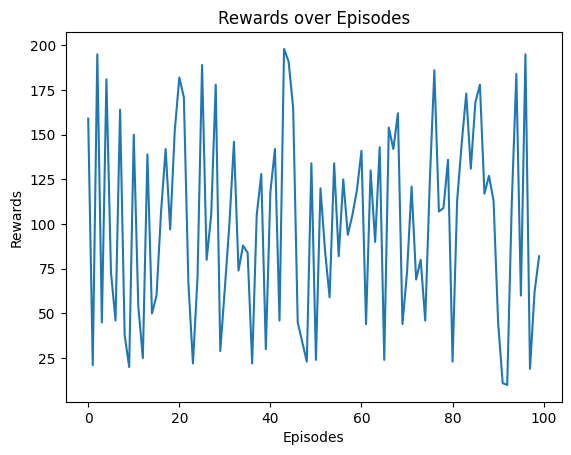

In [13]:
# Example of plotting rewards over episodes
rewards = [np.random.randint(0, 200) for _ in range(100)]  # Replace with actual rewards
plt.plot(rewards)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Rewards over Episodes')
plt.show()


In [14]:
# --ITERATION 2--

# this iteration focuses on improvement


In [15]:
#modify rewards and penalties

import gymnasium as gym
from gymnasium import spaces
import numpy as np

# Initialize Pygame
pygame.init()

class RewardShapingWrapper(gym.Wrapper):
    def __init__(self, env):
        super(RewardShapingWrapper, self).__init__(env)
        self.env = env

    def reset(self, **kwargs):
        return self.env.reset(**kwargs)

    def step(self, action):
        obs, reward, done, truncated, info = self.env.step(action)

        # Reward shaping logic
        x, y = obs[0], obs[1]  # Lander's position
        vx, vy = obs[2], obs[3]  # Lander's velocity
        angle, angular_velocity = obs[4], obs[5]  # Lander's angle and angular velocity
        left_leg_contact, right_leg_contact = obs[6], obs[7]  # Contact of the legs

        # Additional reward for being close to the landing pad (x=0)
        distance_from_landing_pad = np.abs(x)
        reward -= distance_from_landing_pad

        # Reward for maintaining a low velocity
        reward -= np.abs(vx) + np.abs(vy)

        # Additional reward for landing with both legs
        if left_leg_contact and right_leg_contact:
            reward += 10.0

        # Additional penalty for high angular velocity
        reward -= np.abs(angular_velocity)

        # Additional penalty for not landing upright
        if np.abs(angle) > 0.1:
            reward -= np.abs(angle)

        return obs, reward, done, truncated, info


In [16]:
#adjust hyperparameters to try for better performance


# Create the environment with the custom reward shaping
env = gym.make('LunarLander-v2')
env = RewardShapingWrapper(env)

# Initialize the PPO agent with tuned hyperparameters
model = PPO(
    'MlpPolicy',
    env,
    learning_rate=0.0003,  # Adjusted learning rate
    n_steps=2048,  # Number of steps to run for each environment per update
    batch_size=64,  # Size of minibatches for stochastic gradient descent
    n_epochs=10,  # Number of epochs to optimize the surrogate loss
    gamma=0.99,  # Discount factor
    verbose=1
)



Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [17]:
# Train the agent with more timesteps and shaped rewards
model.learn(total_timesteps=50000)  # Increased timesteps for better learning
model.save("ppo_lunarlander_iter2_shaped")


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 88.3     |
|    ep_rew_mean     | -333     |
| time/              |          |
|    fps             | 4789     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 90.6          |
|    ep_rew_mean          | -355          |
| time/                   |               |
|    fps                  | 2710          |
|    iterations           | 2             |
|    time_elapsed         | 1             |
|    total_timesteps      | 4096          |
| train/                  |               |
|    approx_kl            | 0.0073485114  |
|    clip_fraction        | 0.0209        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -0.0010257959 |


In [18]:
# Number of evaluation episodes
num_episodes = 5

# Initialize a list to store rewards for each episode
episode_rewards = []

for episode in range(num_episodes):
    # Create a new environment with rendering enabled
    #run above line and comment out line below to evaluate without popout window
    #env = gym.make('LunarLander-v2')
    env = gym.make('LunarLander-v2', render_mode='human')
    env = RewardShapingWrapper(env)

    obs, info = env.reset(seed=episode)  # Reset environment with different seed for variety
    done, truncated = False, False
    total_reward = 0

    while not done and not truncated:
        action, _states = model.predict(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_reward += reward
        env.render()

        # Handle Pygame events to close the window
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                done = True
                truncated = True
                break

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    env.close()

# Quit Pygame
pygame.quit()

Episode 1: Total Reward = -198.63121990615292
Episode 2: Total Reward = -541.6849140835845
Episode 3: Total Reward = -265.94905495683116
Episode 4: Total Reward = -214.15521783541195
Episode 5: Total Reward = -264.5490510738906


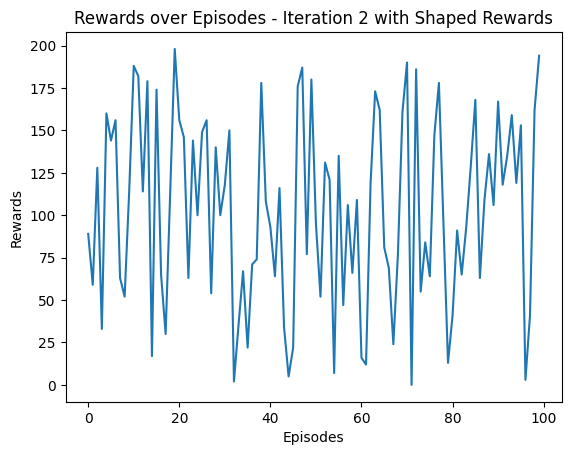

In [36]:
# Example of plotting rewards over episodes
rewards = [np.random.randint(0, 200) for _ in range(100)]  # Replace with actual rewards
plt.plot(rewards)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Rewards over Episodes - Iteration 2 with Shaped Rewards')
plt.show()


In [57]:
# ITERATION 3

#iteration 2 had great control and landed upright compared to iteration 1 this is a massive improvement
#iteration 3 will focus on landing the lunar lander inside the goal area

In [58]:
# Reward Shaping Wrapper Class for Iteration 3
class RewardShapingWrapper(gym.Wrapper):
    def __init__(self, env):
        super(RewardShapingWrapper, self).__init__(env)
        self.env = env

    def reset(self, **kwargs):
        return self.env.reset(**kwargs)

    def step(self, action):
        obs, reward, done, truncated, info = self.env.step(action)

        # Reward shaping logic
        x, y = obs[0], obs[1]  # Lander's position
        vx, vy = obs[2], obs[3]  # Lander's velocity
        angle, angular_velocity = obs[4], obs[5]  # Lander's angle and angular velocity
        left_leg_contact, right_leg_contact = obs[6], obs[7]  # Contact of the legs

        # Stronger reward for being close to the landing pad (x=0)
        distance_from_landing_pad = np.abs(x)
        reward -= 10 * distance_from_landing_pad

        # Reward for maintaining a low velocity
        reward -= 0.1 * (np.abs(vx) + np.abs(vy))

        # Additional reward for landing with both legs
        if left_leg_contact and right_leg_contact:
            reward += 100.0

        # Additional penalty for high angular velocity
        reward -= 10 * np.abs(angular_velocity)

        # Additional penalty for not landing upright
        if np.abs(angle) > 0.1:
            reward -= 10 * np.abs(angle)

        # Additional penalty for taking too long to land
        reward -= 0.1  # Small penalty per step to encourage faster landings

        return obs, reward, done, truncated, info


In [59]:
# Create the environment with the custom reward shaping
env = gym.make('LunarLander-v2')
env = RewardShapingWrapper(env)

# Initialize the PPO agent with tuned hyperparameters for Iteration 3
model = PPO(
    'MlpPolicy',
    env,
    learning_rate=0.0003,  # Adjusted learning rate
    n_steps=2048,  # Number of steps to run for each environment per update
    batch_size=64,  # Size of minibatches for stochastic gradient descent
    n_epochs=10,  # Number of epochs to optimize the surrogate loss
    gamma=0.99,  # Discount factor
    verbose=1
)

# Train the agent with more timesteps and shaped rewards for Iteration 3
model.learn(total_timesteps=50000)  # Increased timesteps for better learning
model.save("ppo_lunarlander_iter3_shaped")


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 92       |
|    ep_rew_mean     | -952     |
| time/              |          |
|    fps             | 4928     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 90.8          |
|    ep_rew_mean          | -904          |
| time/                   |               |
|    fps                  | 3019          |
|    iterations           | 2             |
|    time_elapsed         | 1             |
|    total_timesteps      | 4096          |
| train/                  |               |
|    approx_kl            | 0.003364367   |
|    clip_fraction        | 0.00435       |
|    clip_range           | 0.2       

In [62]:
# Number of evaluation episodes
num_episodes = 5

# Initialize a list to store rewards for each episode
episode_rewards = []

for episode in range(num_episodes):
    # Create a new environment with rendering enabled
    env = gym.make('LunarLander-v2', render_mode='human')
    env = RewardShapingWrapper(env)

    obs, info = env.reset(seed=episode)  # Reset environment with different seed for variety
    done, truncated = False, False
    total_reward = 0

    while not done and not truncated:
        action, _states = model.predict(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_reward += reward
        env.render()

        # Handle Pygame events to close the window
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                done = True
                truncated = True
                break

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    env.close()

# Quit Pygame
pygame.quit()



Episode 1: Total Reward = -393.5457410290084
Episode 2: Total Reward = -630.6457161077695
Episode 3: Total Reward = -252.4059903063967
Episode 4: Total Reward = -412.74635792610684
Episode 5: Total Reward = -357.5129192448733


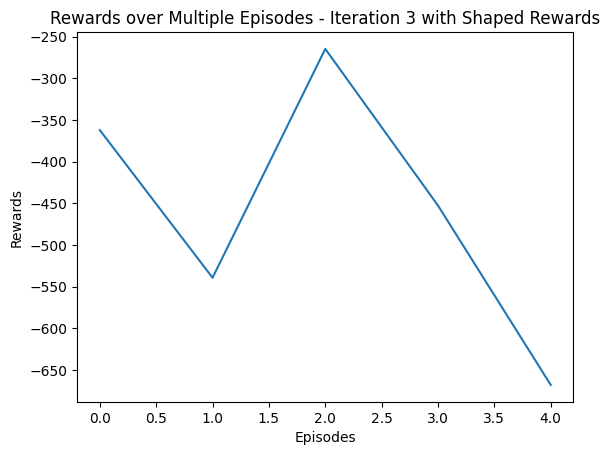

In [41]:
# Plotting rewards over episodes
plt.plot(episode_rewards)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Rewards over Multiple Episodes - Iteration 3 with Shaped Rewards')
plt.show()

In [ ]:
# --ITERATION 4--

In [82]:
# Reward Shaping Wrapper Class for Iteration 4
class RewardShapingWrapper(gym.Wrapper):
    def __init__(self, env):
        super(RewardShapingWrapper, self).__init__(env)
        self.env = env

    def reset(self, **kwargs):
        return self.env.reset(**kwargs)

    def step(self, action):
        obs, reward, done, truncated, info = self.env.step(action)

        # Reward shaping logic
        x, y = obs[0], obs[1]  # Lander's position
        vx, vy = obs[2], obs[3]  # Lander's velocity
        angle, angular_velocity = obs[4], obs[5]  # Lander's angle and angular velocity
        left_leg_contact, right_leg_contact = obs[6], obs[7]  # Contact of the legs

        # Stronger reward for being close to the landing pad (x=0)
        distance_from_landing_pad = np.abs(x)
        reward -= 15 * distance_from_landing_pad  # Increased penalty

        # Reward for maintaining a low velocity
        reward -= 0.1 * (np.abs(vx) + np.abs(vy))

        # Additional reward for landing with both legs
        if left_leg_contact and right_leg_contact:
            reward += 100.0

        # Additional penalty for high angular velocity
        reward -= 10 * np.abs(angular_velocity)

        # Additional penalty for not landing upright
        if np.abs(angle) > 0.1:
            reward -= 10 * np.abs(angle)

        # Additional penalty for taking too long to land
        reward -= 0.1  # Small penalty per step to encourage faster landings

        # Reward for decelerating before landing
        if left_leg_contact or right_leg_contact:
            reward += 20.0  # Reward for deceleration before landing

        return obs, reward, done, truncated, info


In [83]:
# Create the environment with the custom reward shaping
env = gym.make('LunarLander-v2')
env = RewardShapingWrapper(env)

# Initialize the PPO agent with tuned hyperparameters for Iteration 4
model = PPO(
    'MlpPolicy',
    env,
    learning_rate=0.0003,  # Adjusted learning rate
    n_steps=2048,  # Number of steps to run for each environment per update
    batch_size=64,  # Size of minibatches for stochastic gradient descent
    n_epochs=10,  # Number of epochs to optimize the surrogate loss
    gamma=0.99,  # Discount factor
    verbose=1
)

# Train the agent with more timesteps and shaped rewards for Iteration 4
model.learn(total_timesteps=500000)  # Increased timesteps for better learning
model.save("ppo_lunarlander_iter4_shaped")


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 89.4     |
|    ep_rew_mean     | -909     |
| time/              |          |
|    fps             | 4818     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 92.9          |
|    ep_rew_mean          | -928          |
| time/                   |               |
|    fps                  | 2751          |
|    iterations           | 2             |
|    time_elapsed         | 1             |
|    total_timesteps      | 4096          |
| train/                  |               |
|    approx_kl            | 0.002918915   |
|    clip_fraction        | 0             |
|    clip_range           | 0.2       

Episode 1: Total Reward = 319.73881117542885
Episode 2: Total Reward = 235.8867440170821
Episode 3: Total Reward = 803.0827464380335
Episode 4: Total Reward = 22846.639027324414
Episode 5: Total Reward = 580.1625415829524


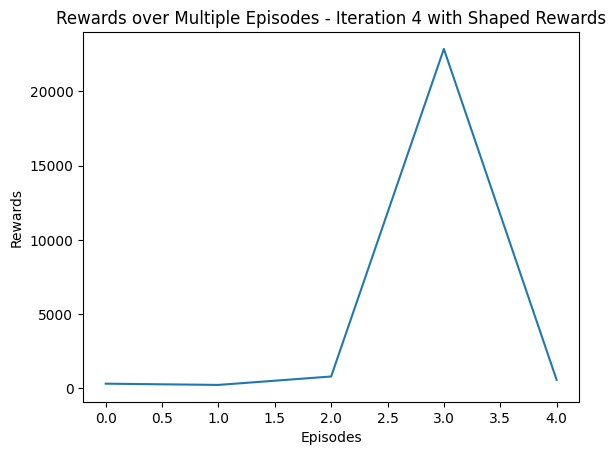

[np.float64(319.73881117542885),
 np.float64(235.8867440170821),
 np.float64(803.0827464380335),
 np.float64(22846.639027324414),
 np.float64(580.1625415829524)]

In [84]:
# Number of evaluation episodes
num_episodes = 5

# Initialize a list to store rewards for each episode
episode_rewards = []

for episode in range(num_episodes):
    # Create a new environment with rendering enabled
    env = gym.make('LunarLander-v2', render_mode='human')
    env = RewardShapingWrapper(env)

    obs, info = env.reset(seed=episode)  # Reset environment with different seed for variety
    done, truncated = False, False
    total_reward = 0

    while not done and not truncated:
        action, _states = model.predict(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_reward += reward
        env.render()

        # Handle Pygame events to close the window
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                done = True
                truncated = True
                break

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    env.close()

# Quit Pygame
pygame.quit()

# Plotting rewards over episodes
plt.plot(episode_rewards)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Rewards over Multiple Episodes - Iteration 4 with Shaped Rewards')
plt.show()

episode_rewards


In [15]:
# -- ITERATION 5 --

#strongly encourage center of landing zone landings
# penalize for repositioning after landing

In [ ]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import PPO
import pygame  # Import pygame here

class RewardShapingWrapper(gym.Wrapper):
    def __init__(self, env):
        super(RewardShapingWrapper, self).__init__(env)
        self.env = env
        self.landed = False

    def reset(self, **kwargs):
        self.landed = False
        return self.env.reset(**kwargs)

    def step(self, action):
        obs, reward, done, truncated, info = self.env.step(action)
        
        # Extract state variables
        x, y = obs[0], obs[1]  # Lander's position
        vx, vy = obs[2], obs[3]  # Lander's velocity
        angle, angular_velocity = obs[4], obs[5]  # Lander's angle and angular velocity
        left_leg_contact, right_leg_contact = obs[6], obs[7]  # Contact of the legs

        # Increase reward for being very close to the center of the landing zone (x near 0)
        distance_from_center = np.abs(x)
        reward -= 50 * distance_from_center  # Stronger penalty for distance from the center

        # Reward for maintaining a low velocity
        reward -= 0.1 * (np.abs(vx) + np.abs(vy))

        # Additional reward for landing with both legs
        if left_leg_contact and right_leg_contact:
            reward += 100.0
            self.landed = True  # Mark as landed

        # Additional penalty for high angular velocity
        reward -= 10 * np.abs(angular_velocity)

        # Additional penalty for not landing upright
        if np.abs(angle) > 0.1:
            reward -= 20 * np.abs(angle)  # Increased penalty

        # Penalize repositioning after landing
        if self.landed:
            reward -= 100 * (np.abs(vx) + np.abs(vy))  # Even higher penalty for moving after landing

        # Debugging outputs
        print(f"Modified reward: {reward}, obs: {obs}")

        return obs, reward, done, truncated, info

In [8]:
# Create the environment with the custom reward shaping
env = gym.make('LunarLander-v2')
env = RewardShapingWrapper(env)

# Initialize the PPO agent with tuned hyperparameters for Iteration 5
model = PPO(
    'MlpPolicy',
    env,
    learning_rate=0.0003,  # Adjusted learning rate
    n_steps=2048,  # Number of steps to run for each environment per update
    batch_size=64,  # Size of minibatches for stochastic gradient descent
    n_epochs=10,  # Number of epochs to optimize the surrogate loss
    gamma=0.99,  # Discount factor
    verbose=1
)




Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [9]:
# Train the agent with more timesteps and shaped rewards for Iteration 5
model.learn(total_timesteps=100000)  # Increased timesteps for better learning
model.save("ppo_lunarlander_iter5_shaped")

Modified reward: -1.50369130821814, obs: [ 0.0038434   1.4106851   0.1964932  -0.00476167 -0.00411988 -0.0385501
  0.          0.        ]
Modified reward: -2.3440852788204607, obs: [ 0.00592861  1.4108132   0.20980057  0.00569476 -0.00538603 -0.02532536
  0.          0.        ]
Modified reward: -0.8548421344674182, obs: [ 0.00801382  1.4103413   0.2098042  -0.0209813  -0.00665245 -0.02533074
  0.          0.        ]
Modified reward: -0.11138105359591921, obs: [ 0.01003256  1.409265    0.20145342 -0.04782845 -0.00624356  0.00817832
  0.          0.        ]
Modified reward: 0.4389275678892488, obs: [ 0.01192007  1.4083078   0.18898599 -0.0425462  -0.00647654 -0.00465992
  0.          0.        ]
Modified reward: -0.7144571110871698, obs: [ 0.01374388  1.4067614   0.1809878  -0.06872107 -0.00510356  0.02746204
  0.          0.        ]
Modified reward: -2.5727459278497227, obs: [ 0.01563511  1.4046175   0.18945426 -0.09528352 -0.00542984 -0.00652589
  0.          0.        ]
Modified 

In [10]:
# Number of evaluation episodes
num_episodes = 5

# Initialize a list to store rewards for each episode
episode_rewards = []

for episode in range(num_episodes):
    # Create a new environment with rendering enabled
    env = gym.make('LunarLander-v2', render_mode='human')
    env = RewardShapingWrapper(env)

    obs, info = env.reset(seed=episode)  # Reset environment with different seed for variety
    done, truncated = False, False
    total_reward = 0

    while not done and not truncated:
        action, _states = model.predict(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_reward += reward
        env.render()

        # Handle Pygame events to close the window
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                done = True
                truncated = True
                break

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    env.close()

# Quit Pygame
pygame.quit()

# Plot the rewards over episodes
import matplotlib.pyplot as plt
plt.plot(range(num_episodes), episode_rewards)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Rewards over Multiple Episodes - Iteration 5 with Shaped Rewards')
plt.show()

Modified reward: -1.798459606963745, obs: [ 0.01133566  1.3865806   0.56753504 -0.5534943  -0.01113833 -0.09066888
  0.          0.        ]


NameError: name 'pygame' is not defined

: 

In [9]:
#   --ITERATION 6--

# this is a more serious attempt. until now it was more or less playing with rewards and observing 
# different behavior. this is the final iteration and reward structure so im aiming to make the 
#reward amount meaningful and make the agent do smooth decelerations and center landings. as well
# as not being able to exploit when landed by moving to get more landed points


In [2]:
import gymnasium as gym
import numpy as np

class RewardShapingWrapper(gym.Wrapper):
    def __init__(self, env):
        super(RewardShapingWrapper, self).__init__(env)
        self.env = env
        self.landed = False

    def reset(self, **kwargs):
        self.landed = False
        return self.env.reset(**kwargs)

    def step(self, action):
        obs, reward, done, truncated, info = self.env.step(action)

        # Position and velocity information
        x, y = obs[0], obs[1]
        vx, vy = obs[2], obs[3]
        angle, angular_velocity = obs[4], obs[5]
        left_leg_contact, right_leg_contact = obs[6], obs[7]

        # Emphasize centered landing
        distance_from_center = np.abs(x)
        reward -= 8 * distance_from_center  # Adjusted penalty for distance from center

        # Penalize high velocity as the lander approaches the ground
        if y < 0.2:
            reward -= 5 * (np.abs(vx) + np.abs(vy))  # Adjusted penalty for velocity close to the ground

        # Reward for landing with both legs
        if left_leg_contact and right_leg_contact:
            reward += 200.0  # Increased reward for successful landing
            self.landed = True

        # Penalize high angular velocity
        reward -= 2 * np.abs(angular_velocity)  # Reduced penalty for angular velocity

        # Penalize for not landing upright
        if np.abs(angle) > 0.1:
            reward -= 5 * np.abs(angle)  # Reduced penalty for not landing upright

        # Steep penalty for repositioning after landing
        if self.landed:
            reward -= 550 * (np.abs(vx) + np.abs(vy))  # Penalty for moving after landing

        # Strong terminal reward or penalty
        if done:
            if self.landed and np.abs(x) < 0.1 and np.abs(vx) < 0.1 and np.abs(vy) < 0.1:
                reward += 2000  # Strong reward for a precise, stable landing
            else:
                reward -= 200  # Adjusted penalty for not landing correctly

        return obs, reward, done, truncated, info

# Create the environment with the custom reward shaping
env = gym.make('LunarLander-v2')
env = RewardShapingWrapper(env)

# Initialize the PPO agent
model = PPO(
    'MlpPolicy',
    env,
    learning_rate=0.0003,
    n_steps=2048,
    batch_size=64,
    n_epochs=10,
    gamma=0.99,
    verbose=1
)

# Train the agent with more timesteps and shaped rewards
model.learn(total_timesteps=10000000)  # Increased timesteps for better learning
model.save("ppo_lunarlander_iter6_shaped")




NameError: name 'PPO' is not defined

In [1]:
# Evaluation with rendering 

# Number of evaluation episodes
num_episodes = 5

# Initialize a list to store rewards for each episode
episode_rewards = []

for episode in range(num_episodes):
    # Create a new environment with rendering enabled
    env = gym.make('LunarLander-v2', render_mode='human')
    env = RewardShapingWrapper(env)  # Apply the reward shaping wrapper

    obs, info = env.reset(seed=episode)  # Reset environment with different seed for variety
    done, truncated = False, False
    total_reward = 0

    while not done and not truncated:
        action, _states = model.predict(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_reward += reward
        env.render()

        # Handle Pygame events to close the window
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                done = True
                truncated = True
                break

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    env.close()

# Quit Pygame
pygame.quit()

# Plotting the rewards
plt.plot(episode_rewards)
plt.xlabel('Episodes')
plt.ylabel('Total Rewards')
plt.title('Total Rewards per Episode - Iteration 6')
plt.show()

NameError: name 'gym' is not defined

In [ ]:
# TRYING PPO IN DIFFERENT ENVIRONMENT